
<html>
<div style="text-align: center">  
  <img src="https://miro.medium.com/v2/resize:fit:1358/1*cG6U1qstYDijh9bPL42e-Q.jpeg" width=260px style="padding:10px; text-align: left;"/> </div>


    
    

<div style="background-image: linear-gradient(to left, rgb(255, 255, 255), rgb( 170, 141, 220 )); width: auto; text-align: center; height: 40px; margin: 10px;">
<h1 style="font-family: Georgia; color: black;">AI - Project4 : Machine Learning</h1>
</div>
<div style=" background-image: linear-gradient(to left, rgb(255, 255, 255), rgb( 219, 204, 245  )); width: 400px; height: 30px; margin: 10px; text-alighn:middle">
  <span style="font-family: Georgia; font-size:15pt; color: ; vertical-align: left;">Shahzad Momayez </span>
    
</div>
    
<div style=" background-image: linear-gradient(to left, rgb(255, 255, 255), rgb( 219, 204, 245  )); width: 400px; height: 30px; margin:10px 10px; text-alighn:middle">
  <span style="font-family: Georgia; font-size:12pt; color: ; vertical-align: left;">Student Id: 810100272</span>
    
</div>
</html>


In [126]:
import pandas as pd
import seaborn 
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

In [127]:
df = pd.read_csv('marketing_campaign.csv')
df


,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoffee,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumWebVisitsMonth,Complain,NumPurchases,UsedCampaignOffer
0,0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635.0,88,546,172,88,88.0,NaN,0,25,1
1,1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,NaN,1,6,2,1,6.0,5.0,0,6,0
2,2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,NaN,49,127,111,21,42.0,NaN,0,21,0
3,3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11.0,4,20,10,3,5.0,6.0,0,8,0
4,4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173.0,43,118,46,27,15.0,5.0,0,19,0
5,5,7446,1967,Master,Together,NaN,0,1,09-09-2013,16,520.0,42,98,0,42,14.0,NaN,0,22,0
6,6,965,1971,Graduation,Divorced,55635.0,0,1,13-11-2012,34,235.0,65,164,50,49,27.0,6.0,0,21,0
7,7,6177,1985,PhD,Married,33454.0,1,0,08-05-2013,32,76.0,10,56,3,1,23.0,8.0,0,10,0
8,8,4855,1974,PhD,Together,30351.0,1,0,06-06-2013,19,14.0,0,24,3,3,2.0,9.0,0,6,1
9,9,5899,1950,PhD,Together,5648.0,1,1,13-03-2014,68,28.0,0,6,1,1,13.0,20.0,0,2,1


## Question1 : use info() and describe()

In [128]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         2240 non-null   int64  
 1   ID                 2240 non-null   int64  
 2   Year_Birth         2240 non-null   int64  
 3   Education          2240 non-null   object 
 4   Marital_Status     2240 non-null   object 
 5   Income             2017 non-null   float64
 6   Kidhome            2240 non-null   int64  
 7   Teenhome           2240 non-null   int64  
 8   Dt_Customer        2240 non-null   object 
 9   Recency            2240 non-null   int64  
 10  MntCoffee          2035 non-null   float64
 11  MntFruits          2240 non-null   int64  
 12  MntMeatProducts    2240 non-null   int64  
 13  MntFishProducts    2240 non-null   int64  
 14  MntSweetProducts   2240 non-null   int64  
 15  MntGoldProds       2227 non-null   float64
 16  NumWebVisitsMonth  2040 

In [129]:
df.describe()

,Unnamed: 0,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntCoffee,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumWebVisitsMonth,Complain,NumPurchases,UsedCampaignOffer
count,2240.000000,2240.000000,2240.000000,2017.000000,2240.000000,2240.000000,2240.000000,2035.000000,2240.000000,2240.000000,2240.000000,2240.000000,2227.000000,2040.000000,2240.000000,2240.000000,2240.000000
mean,1119.500000,5592.159821,1968.805804,52297.080317,0.437946,0.506250,49.109375,304.239312,26.302232,166.950000,37.525446,27.062946,43.847777,5.326961,0.009375,14.862054,0.271875
std,646.776623,3246.662198,11.984069,25543.108215,0.563666,0.544538,28.962453,337.515534,39.773434,225.715373,54.628979,41.280498,51.897098,2.439349,0.096391,7.677173,0.445025
min,0.000000,0.000000,1893.000000,2447.000000,-5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,559.750000,2828.250000,1959.000000,35340.000000,0.000000,0.000000,24.000000,23.000000,1.000000,16.000000,3.000000,1.000000,9.000000,3.000000,0.000000,8.000000,0.000000
50%,1119.500000,5458.500000,1970.000000,51369.000000,0.000000,0.000000,49.000000,177.000000,8.000000,67.000000,12.000000,8.000000,24.000000,6.000000,0.000000,15.000000,0.000000
75%,1679.250000,8427.750000,1977.000000,68316.000000,1.000000,1.000000,74.000000,505.000000,33.000000,232.000000,50.000000,33.000000,56.000000,7.000000,0.000000,21.000000,1.000000
max,2239.000000,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,20.000000,1.000000,44.000000,1.000000


## Question2: For each feature, obtain the number and proportion of missing data.


In [130]:
missing_values_count =  df.isnull().sum()
missing_values_count

Unnamed: 0             0
ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income               223
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntCoffee            205
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds          13
NumWebVisitsMonth    200
Complain               0
NumPurchases           0
UsedCampaignOffer      0
dtype: int64

In [131]:
number_of_data = df.sum()
number_of_data

Unnamed: 0                                                     2507680
ID                                                            12526438
Year_Birth                                                     4410125
Education            GraduationGraduationGraduationGraduationPhDMas...
Marital_Status       SingleSingleTogetherTogetherMarriedTogetherDiv...
Income                                                     105483211.0
Kidhome                                                            981
Teenhome                                                          1134
Dt_Customer          04-09-201208-03-201421-08-201310-02-201419-01-...
Recency                                                         110005
MntCoffee                                                     619127.0
MntFruits                                                        58917
MntMeatProducts                                                 373968
MntFishProducts                                                  84057
MntSwe

In [132]:
non_missing_counts = df.count()
non_missing_counts 


Unnamed: 0           2240
ID                   2240
Year_Birth           2240
Education            2240
Marital_Status       2240
Income               2017
Kidhome              2240
Teenhome             2240
Dt_Customer          2240
Recency              2240
MntCoffee            2035
MntFruits            2240
MntMeatProducts      2240
MntFishProducts      2240
MntSweetProducts     2240
MntGoldProds         2227
NumWebVisitsMonth    2040
Complain             2240
NumPurchases         2240
UsedCampaignOffer    2240
dtype: int64

In [133]:
len_of_df = len(df)
len_of_df

2240

In [134]:
porpoertion = df.isnull().sum() / len_of_df
porpoertion

Unnamed: 0           0.000000
ID                   0.000000
Year_Birth           0.000000
Education            0.000000
Marital_Status       0.000000
Income               0.099554
Kidhome              0.000000
Teenhome             0.000000
Dt_Customer          0.000000
Recency              0.000000
MntCoffee            0.091518
MntFruits            0.000000
MntMeatProducts      0.000000
MntFishProducts      0.000000
MntSweetProducts     0.000000
MntGoldProds         0.005804
NumWebVisitsMonth    0.089286
Complain             0.000000
NumPurchases         0.000000
UsedCampaignOffer    0.000000
dtype: float64

# Question 3: Draw a diagram of the dependence of the features on each other. Which features are more dependent on the target column?

 respectively MntCoffee, Income, MntMeatProducts are mostlty related to our goal column


C:\Users\LENOVO\AppData\Local\Temp\ipykernel_7936\368700950.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


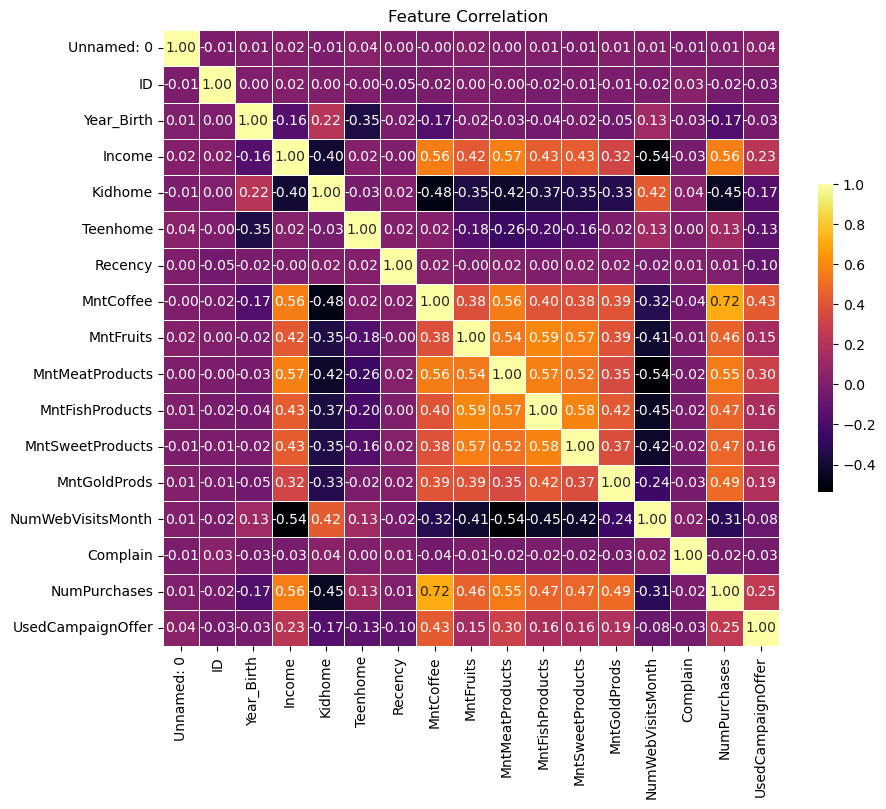

In [135]:
correlation_matrix = df.corr()
f, ax = plt.subplots(figsize=(10, 8))

truthness= True
cm = 'inferno'
seaborn.heatmap(correlation_matrix, annot=truthness, fmt=".2f", cmap= cm ,
            square=truthness, linewidths=.6, cbar_kws={"shrink": .5}, ax=ax)

plt.title('Feature Correlation ')
plt.show()

In [136]:
df.corr().style.background_gradient(cmap='coolwarm').set_precision(2)

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_7936\3129850035.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_7936\3129850035.py:1: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  df.corr().style.background_gradient(cmap='coolwarm').set_precision(2)


,Unnamed: 0,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntCoffee,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumWebVisitsMonth,Complain,NumPurchases,UsedCampaignOffer
Unnamed: 0,1.00,-0.01,0.01,0.02,-0.01,0.04,0.00,-0.00,0.02,0.00,0.01,-0.01,0.01,0.01,-0.01,0.01,0.04
ID,-0.01,1.00,0.00,0.02,0.00,-0.00,-0.05,-0.02,0.00,-0.00,-0.02,-0.01,-0.01,-0.02,0.03,-0.02,-0.03
Year_Birth,0.01,0.00,1.00,-0.16,0.22,-0.35,-0.02,-0.17,-0.02,-0.03,-0.04,-0.02,-0.05,0.13,-0.03,-0.17,-0.03
Income,0.02,0.02,-0.16,1.00,-0.40,0.02,-0.00,0.56,0.42,0.57,0.43,0.43,0.32,-0.54,-0.03,0.56,0.23
Kidhome,-0.01,0.00,0.22,-0.40,1.00,-0.03,0.02,-0.48,-0.35,-0.42,-0.37,-0.35,-0.33,0.42,0.04,-0.45,-0.17
Teenhome,0.04,-0.00,-0.35,0.02,-0.03,1.00,0.02,0.02,-0.18,-0.26,-0.20,-0.16,-0.02,0.13,0.00,0.13,-0.13
Recency,0.00,-0.05,-0.02,-0.00,0.02,0.02,1.00,0.02,-0.00,0.02,0.00,0.02,0.02,-0.02,0.01,0.01,-0.10
MntCoffee,-0.00,-0.02,-0.17,0.56,-0.48,0.02,0.02,1.00,0.38,0.56,0.40,0.38,0.39,-0.32,-0.04,0.72,0.43
MntFruits,0.02,0.00,-0.02,0.42,-0.35,-0.18,-0.00,0.38,1.00,0.54,0.59,0.57,0.39,-0.41,-0.01,0.46,0.15
MntMeatProducts,0.00,-0.00,-0.03,0.57,-0.42,-0.26,0.02,0.56,0.54,1.00,0.57,0.52,0.35,-0.54,-0.02,0.55,0.30


# Question 4: For the characteristics obtained in the previous step, draw a graph of the number of observations of each unique value


In [137]:
most_relevent= df[['Income' , 'MntCoffee' , 'MntMeatProducts', 'MntGoldProds']]
most_relevent

,Income,MntCoffee,MntMeatProducts,MntGoldProds
0,58138.0,635.0,546,88.0
1,46344.0,NaN,6,6.0
2,71613.0,NaN,127,42.0
3,26646.0,11.0,20,5.0
4,58293.0,173.0,118,15.0
5,NaN,520.0,98,14.0
6,55635.0,235.0,164,27.0
7,33454.0,76.0,56,23.0
8,30351.0,14.0,24,2.0
9,5648.0,28.0,6,13.0


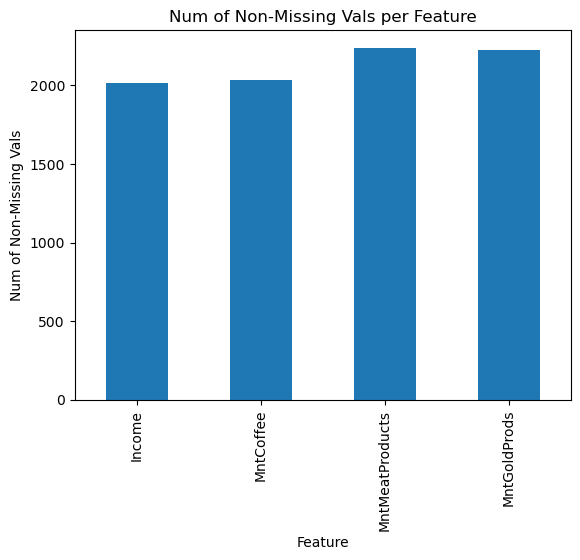

In [138]:
relevent_non_missing = most_relevent.count()
relevent_non_missing

relevent_non_missing.plot(kind='bar')
plt.xlabel('Feature')
plt.ylabel('Num of Non-Missing Vals')
plt.title('Num of Non-Missing Vals per Feature')

plt.show()

# Question 5 and 6

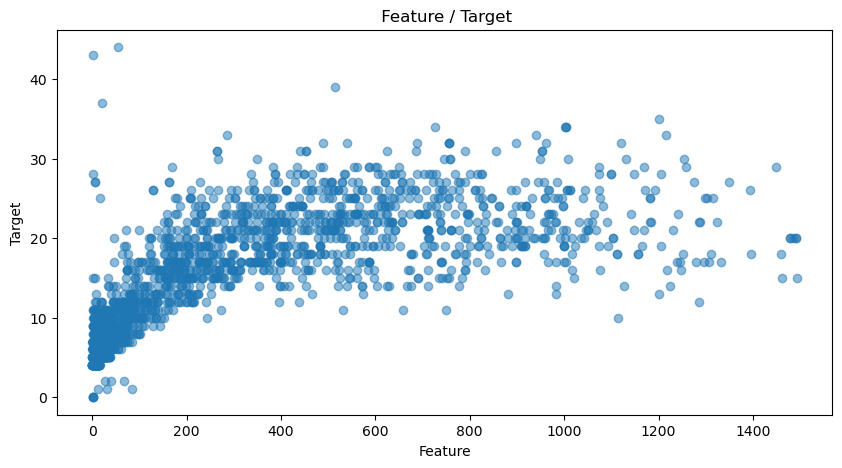

In [139]:
plt.figure(figsize=(10, 5))
plt.scatter(df[[ 'MntCoffee' ]], df['NumPurchases'], alpha=0.5)
plt.title(' Feature / Target')
plt.xlabel('Feature')
plt.ylabel('Target')
plt.show()

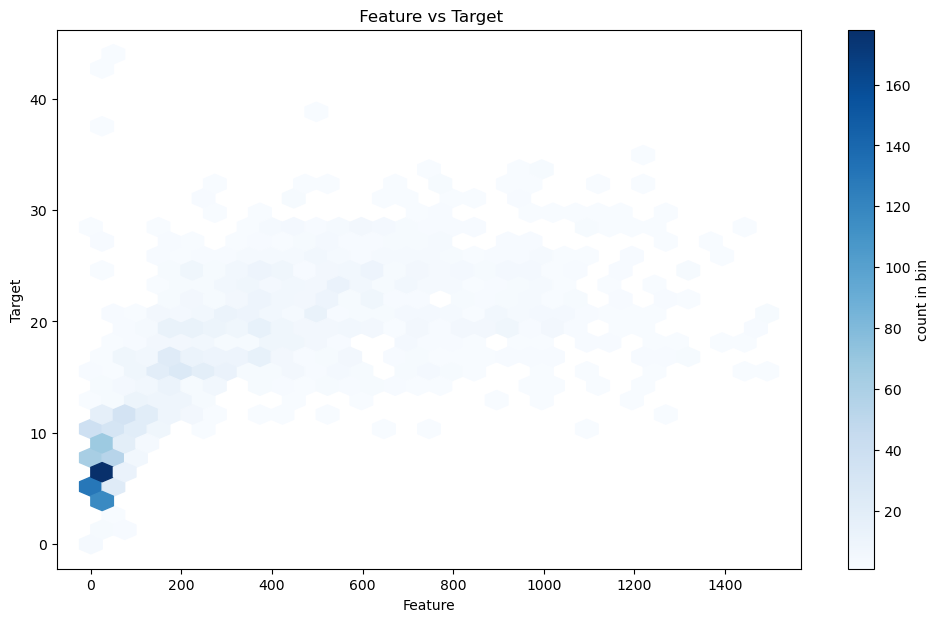

In [140]:
plt.figure(figsize=(12, 7))
plt.hexbin(df['MntCoffee' ], df['NumPurchases'], gridsize=30, cmap='Blues', mincnt=1)
plt.title(' Feature vs Target')
plt.xlabel('Feature')
plt.ylabel('Target')
cb = plt.colorbar(label='count in bin')

plt.show()

# Data set preprocessing

## Question7: Two ways to solve the Missing Values problem are to delete the entire column and fill the empty values with statistics. Explain and compare the rest of the methods.

In data preprocessing, handling missing values is crucial because they can lead to biased or invalid results. Here’s an overview of different methods to handle missing values in a DataFrame:

##### 1. Deleting Data:
Row Deletion (Listwise Deletion): Remove records with missing values.
Pros: Easy to implement, leaves only complete cases.
Cons: Reduces dataset size, can introduce bias if data is not missing completely at random (MCAR).
Column Deletion: Delete entire columns with a significant number of missing values.
Pros: Quick solution when most values are missing.
Cons: Loses potentially important data, not a good method when many columns have missing data.
##### 2. Imputation Using Central Tendency:
Mean/Median/Mode Imputation: Replace missing values with the mean, median, or mode of the column.
Pros: Preserves dataset size, easy to implement.
Cons: May distort the original data distribution, affects variance and correlation estimates.
##### 3. Imputation Using Predictive Models:
Regression Imputation: Predict missing values using a regression model.
Pros: More accurate if relationships are well-modeled.
Cons: Computationally intensive, potential overfitting issues.
k-Nearest Neighbors (k-NN): Impute using the nearest neighbors’ values.
Pros: Can give more accurate predictions using local data structure.
Cons: Sensitive to outliers, scalability issues with large data.
##### 4. Imputation Using Algorithms:
Multivariate Imputation by Chained Equations (MICE): Performs multiple imputations based on the dataset’s structure.
Pros: Accounts for the uncertainty in imputations, more comprehensive.
Cons: Can be complex to implement and interpret.
Machine Learning Algorithms: Certain algorithms like XGBoost can handle missing values intrinsically.
Pros: No need for explicit imputation.
Cons: Not suitable for all algorithms; the internal method may not be transparent.
##### 5. Imputation Using Deep Learning:
Autoencoders: Neural networks that can encode the data and impute missing values.
Pros: Can model complex patterns and relationships.
Cons: Requires substantial computing power, opaque models.
##### 6. Imputation Using Iterative Methods:
Iterative Imputation (EM, DataWig): Sequentially models each variable with missing data.
Pros: Takes into account interactions between multiple variables.
Cons: Requires iteration, which can be computationally expensive.
##### 7. Using Default Values:
Domain-Specific Default Imputation: Replace missing values with a domain-specific default value.
Pros: Can be suitable for categorical data with a ‘missing’ category.
Cons: Implies making assumptions that might not be correct.


##### Comparison:
- Deletion methods are quick and straightforward but can waste valuable data and introduce bias.
- Central tendency imputation is easy but often distorts the dataset’s statistical properties.
- Predictive models for imputation are more sophisticated and can produce better imputed values but are more complex and computationally expensive.
- Algorithm-specific methods may be convenient but limit the choice of further analysis methods.
- Deep learning approaches are powerful and flexible but require large datasets and computational resources.
- Iterative methods are thorough but can be slow and complex.

###### The choice of method often depends on:

- The proportion of missing data and its pattern.
- The importance of preserving the original dataset’s structure.
- The availability of computational resources.
- The desired accuracy and bias-variance trade-off.
- Whether data is missing at random or if there’s a pattern to the missingness.
- A prudent approach to handling missing data often involves exploratory data analysis (EDA) to understand the nature of the missing values, followed by a carefully chosen method or a combination of methods to mitigate potential biases and data loss.

## Question8: Based on the results of the previous phase, which data have the highest amount of missing data? For all features, solve the problem of missing data with the help of the mentioned methods.
features that have missing data are: Income, MntCoffee, MntGoldProds, NumWebVisitsMonth

- NumWebVisitsMonth: mode
- MntGoldProds : mean
- Income : mean
- MntCoffee :median

In [141]:
missing_values_count

Unnamed: 0             0
ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income               223
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntCoffee            205
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds          13
NumWebVisitsMonth    200
Complain               0
NumPurchases           0
UsedCampaignOffer      0
dtype: int64

In [142]:
selected = df[['Income', 'MntCoffee', 'MntGoldProds', 'NumWebVisitsMonth']].copy()
selected.to_csv('selected_columns.csv', index=False)
max_row_opt ='display.max_rows'
max_col_opt ='display.max_columns'
state = None
pd.set_option(max_row_opt, state)  
pd.set_option(max_col_opt, state) 
print(selected)

        Income  MntCoffee  MntGoldProds  NumWebVisitsMonth
0      58138.0      635.0          88.0                NaN
1      46344.0        NaN           6.0                5.0
2      71613.0        NaN          42.0                NaN
3      26646.0       11.0           5.0                6.0
4      58293.0      173.0          15.0                5.0
5          NaN      520.0          14.0                NaN
6      55635.0      235.0          27.0                6.0
7      33454.0       76.0          23.0                8.0
8      30351.0       14.0           2.0                9.0
9       5648.0       28.0          13.0               20.0
10         NaN        5.0           1.0                7.0
11      7500.0        6.0          16.0                8.0
12     63033.0      194.0          30.0                2.0
13     59354.0      233.0          14.0                6.0
14     17323.0        3.0           5.0                8.0
15     82800.0     1006.0          45.0                3

In [143]:
min_value = df['Income'].min()
max_value = df['Income'].max()
median_value = df['Income'].median()
mean_value = df['Income'].mean()
variance_value = df['Income'].var()
mode_value = df['Income'].mode()
print("INCOME:")
print("Minimum:", min_value)
print("Maximum:", max_value)
print("Median:", median_value)
print("Mean:", mean_value)
print("Variance: ", variance_value)
print("mode_value: ", mode_value[0])


min_value = df['MntCoffee'].min()
max_value = df['MntCoffee'].max()
median_value = df['MntCoffee'].median()
mean_value = df['MntCoffee'].mean()
variance_value = df['MntCoffee'].var()
mode_value = df['MntCoffee'].mode()
print("\n ---------------------")
print("MntCoffee:")
print("Minimum:", min_value)
print("Maximum:", max_value)
print("Median:", median_value)
print("Mean:", mean_value)
print("Variance: ", variance_value)
print("mode_value: ", mode_value[0])


min_value = df['MntGoldProds'].min()
max_value = df['MntGoldProds'].max()
median_value = df['MntGoldProds'].median()
mean_value = df['MntGoldProds'].mean()
variance_value = df['MntGoldProds'].var()
mode_value = df['MntGoldProds'].mode()
print("\n ---------------------")
print(" MntGoldProds:")
print("Minimum:", min_value)
print("Maximum:", max_value)
print("Median:", median_value)
print("Mean:", mean_value)
print("Variance: ", variance_value)
print("mode_value: ", mode_value[0])


min_value = df['NumWebVisitsMonth'].min()
max_value = df['NumWebVisitsMonth'].max()
median_value = df['NumWebVisitsMonth'].median()
mean_value = df['NumWebVisitsMonth'].mean()
variance_value = df['NumWebVisitsMonth'].var()
mode_value = df['NumWebVisitsMonth'].mode()
print("\n ---------------------")
print("NumWebVisitsMonth:")
print("Minimum:", min_value)
print("Maximum:", max_value)
print("Median:", median_value)
print("Mean:", mean_value)
print("Variance: ", variance_value)
print("mode_value: ", mode_value[0])


INCOME:
Minimum: 2447.0
Maximum: 666666.0
Median: 51369.0
Mean: 52297.08031730293
Variance:  652450377.3040624
mode_value:  7500.0

 ---------------------
MntCoffee:
Minimum: 0.0
Maximum: 1493.0
Median: 177.0
Mean: 304.23931203931204
Variance:  113916.7357202741
mode_value:  2.0

 ---------------------
 MntGoldProds:
Minimum: 0.0
Maximum: 362.0
Median: 24.0
Mean: 43.84777727885047
Variance:  2693.3088034579987
mode_value:  1.0

 ---------------------
NumWebVisitsMonth:
Minimum: 0.0
Maximum: 20.0
Median: 6.0
Mean: 5.326960784313726
Variance:  5.95042528536677
mode_value:  7.0


In [144]:
mode_value = df['NumWebVisitsMonth'].mode()[0] 
df['NumWebVisitsMonth'].fillna(value=mode_value, inplace=True)

mean_value = df['MntGoldProds'].mean()
df['MntGoldProds'].fillna(value=mean_value, inplace=True)

mean_value = df['Income'].mean()
df['Income'].fillna(value=mean_value, inplace=True)

median_value = df['MntCoffee'].median()
df['MntCoffee'].fillna(value=median_value, inplace=True)
df.isnull().sum()


Unnamed: 0           0
ID                   0
Year_Birth           0
Education            0
Marital_Status       0
Income               0
Kidhome              0
Teenhome             0
Dt_Customer          0
Recency              0
MntCoffee            0
MntFruits            0
MntMeatProducts      0
MntFishProducts      0
MntSweetProducts     0
MntGoldProds         0
NumWebVisitsMonth    0
Complain             0
NumPurchases         0
UsedCampaignOffer    0
dtype: int64

 ## Question9: What is the purpose of normalizing or standardizing in numerical features? Is there a need to do this in this project?

Normalizing and standardizing are two different techniques of feature scaling that are commonly used in data preprocessing for machine learning algorithms. Their main purposes are:

#### 1. Scale to a Range (Normalization):

Normalization typically means rescaling the values into a range of [0, 1].
This technique can be useful when the parameters or input features have vastly different scales and units.
It makes the data compatible with various algorithms that assume the data falls within a small range (like between 0 and 1), such as gradient descent-based algorithms , which might converge faster if the features are on a similar scale.
It’s particularly helpful for algorithms that compute distances between data points, like K-Means clustering and K-Nearest Neighbors (KNN), as it ensures that all the features contribute equally to the result.
A common formula for normalization is: 
###  $${(x_i - min(x)) / (max(x) - min(x))}$$

, where x_i is a particular data point, and min(x) and max(x) are the minimum and maximum values of the feature, respectively.
Centering and Scaling (Standardization):

#### 2.Standardization rescales data to have a mean (μ) of 0 and standard deviation (σ) of 1 (unit variance).
It is useful because many machine learning models, especially those that involve optimization like Support Vector Machines (SVM), Linear Regression, and Neural Networks, assume that the features are centered around zero and have variance in the same order.
Unlike normalization, standardization does not bound values to a specific range, which may be a useful feature for certain algorithms that assume no bound on the input.
The standardization is calculated as:
### $${(x_i - μ) / σ}$$

, where x_i is a data point, μ is the mean of the feature, and σ is the standard deviation of the feature.
For some algorithms, standardization can maintain useful information about outliers and makes the algorithm less sensitive to them in contrast to min-max scaling.
Apart from these, both techniques help improve the numerical stability of algorithms and maintain a numerical balance between features. It’s important to apply the same scaling to the test data for model evaluation to maintain consistency with the model’s learned patterns.

When choosing between normalization and standardization, it’s important to consider the specific model you’re using and the nature of your data. Some models might benefit from normalization, while others might achieve better performance with standardization.

It’s also worth noting that for some datasets and problems, scaling might not be necessary and could even lead to worse performance. For instance, tree-based algorithms like Random Forest or Gradient Boosted Trees do not require feature scaling to perform well.

In [145]:
scaler = MinMaxScaler()
numeric_columns = df.select_dtypes(include=[float, int]).columns
df[numeric_columns] = scaler.fit_transform(df[numeric_columns])
df
raw_df = df



## Question 10: To use category features, which are usually stored as a string or object in the data set, what pre-processing is useful in model training? Does all data in this category require these methods?
Some common pre-processing techniques for categorical data include:

 - Label Encoding: Each unique category value is assigned a numerical label. It is a straightforward approach but may not be suitable for all algorithms as it implies an order or precedence that may not exist.

- One-Hot Encoding: Each category level becomes a new binary feature (0 or 1), with only one active “hot” state. This method prevents the model from assuming a natural ordering between categories but increases the data dimensionality.

- Binary Encoding: This is a mix of Hashing and one-hot encoding. It converts categories into binary columns, but the number of columns is less than one-hot encoding.

- Hashing: A hashing algorithm is used to assign a unique code to each category. It limits the dimensionality and can efficiently handle new categories but can lead to collisions.

- Embedding: Useful particularly in deep learning, where embeddings convert categorical variables into continuous vectors in a high-dimensional space.

- Ordinal Encoding: For ordinal data where the categories have a clear ranking or order, preserve this through ordinal encoding.

- Frequency or Count Encoding: Replace categories with the frequency of their occurrence in the dataset.

Whether all category features require such pre-processing depends on the machine learning algorithm you’re using and the specific nature of the data. For example:

- Tree-based models like Decision Trees, Random Forests, and Gradient Boosting Machines can handle categorical variables without encoding (if supported by the implementation), but encoding may still be beneficial depending on the dataset size and cardinality of the category features.

- Distance-based models like K-Nearest Neighbors or Support Vector Machines require encoding because they calculate distances between data points.

Linear Models generally require encoding as they are designed to work with numerical data.

In [146]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in df.select_dtypes(include=['object']).columns: 
    df[col] = le.fit_transform(df[col])
scaler = MinMaxScaler()
numeric_columns = df.select_dtypes(include=[float, int]).columns
df[numeric_columns] = scaler.fit_transform(df[numeric_columns])  
df


,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoffee,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumWebVisitsMonth,Complain,NumPurchases,UsedCampaignOffer
0,0.000000,0.493611,0.621359,0.50,0.571429,0.083844,0.714286,0.0,0.120846,0.585859,0.425318,0.442211,0.316522,0.664093,0.334601,0.243094,0.35,0.0,0.568182,1.0
1,0.000447,0.194263,0.592233,0.50,0.571429,0.066088,0.857143,0.5,0.237160,0.383838,0.118553,0.005025,0.003478,0.007722,0.003802,0.016575,0.25,0.0,0.136364,0.0
2,0.000893,0.370029,0.699029,0.50,0.714286,0.104131,0.714286,0.0,0.670695,0.262626,0.118553,0.246231,0.073623,0.428571,0.079848,0.116022,0.35,0.0,0.477273,0.0
3,0.001340,0.552408,0.883495,0.50,0.714286,0.036432,0.857143,0.0,0.300604,0.262626,0.007368,0.020101,0.011594,0.038610,0.011407,0.013812,0.30,0.0,0.181818,0.0
4,0.001787,0.475739,0.854369,1.00,0.428571,0.084078,0.857143,0.0,0.589124,0.949495,0.115874,0.216080,0.068406,0.177606,0.102662,0.041436,0.25,0.0,0.431818,0.0
5,0.002233,0.665356,0.718447,0.75,0.714286,0.075051,0.714286,0.5,0.285498,0.161616,0.348292,0.211055,0.056812,0.000000,0.159696,0.038674,0.35,0.0,0.500000,0.0
6,0.002680,0.086230,0.757282,0.50,0.285714,0.080076,0.714286,0.5,0.422961,0.343434,0.157401,0.326633,0.095072,0.193050,0.186312,0.074586,0.30,0.0,0.477273,0.0
7,0.003126,0.551961,0.893204,1.00,0.428571,0.046682,0.857143,0.0,0.241692,0.323232,0.050904,0.050251,0.032464,0.011583,0.003802,0.063536,0.40,0.0,0.227273,0.0
8,0.003573,0.433831,0.786408,1.00,0.714286,0.042010,0.857143,0.0,0.179758,0.191919,0.009377,0.000000,0.013913,0.011583,0.011407,0.005525,0.45,0.0,0.136364,1.0
9,0.004020,0.527120,0.553398,1.00,0.714286,0.004819,0.857143,0.5,0.403323,0.686869,0.018754,0.000000,0.003478,0.003861,0.003802,0.035912,1.00,0.0,0.045455,1.0


# Question 11: Is it possible to omit some of the columns?
yes, we should omit unrelevent ones.

In [147]:
df = df.drop(['Recency', 'Teenhome' , 'Complain'], axis=1)
df

,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Dt_Customer,MntCoffee,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumWebVisitsMonth,NumPurchases,UsedCampaignOffer
0,0.000000,0.493611,0.621359,0.50,0.571429,0.083844,0.714286,0.120846,0.425318,0.442211,0.316522,0.664093,0.334601,0.243094,0.35,0.568182,1.0
1,0.000447,0.194263,0.592233,0.50,0.571429,0.066088,0.857143,0.237160,0.118553,0.005025,0.003478,0.007722,0.003802,0.016575,0.25,0.136364,0.0
2,0.000893,0.370029,0.699029,0.50,0.714286,0.104131,0.714286,0.670695,0.118553,0.246231,0.073623,0.428571,0.079848,0.116022,0.35,0.477273,0.0
3,0.001340,0.552408,0.883495,0.50,0.714286,0.036432,0.857143,0.300604,0.007368,0.020101,0.011594,0.038610,0.011407,0.013812,0.30,0.181818,0.0
4,0.001787,0.475739,0.854369,1.00,0.428571,0.084078,0.857143,0.589124,0.115874,0.216080,0.068406,0.177606,0.102662,0.041436,0.25,0.431818,0.0
5,0.002233,0.665356,0.718447,0.75,0.714286,0.075051,0.714286,0.285498,0.348292,0.211055,0.056812,0.000000,0.159696,0.038674,0.35,0.500000,0.0
6,0.002680,0.086230,0.757282,0.50,0.285714,0.080076,0.714286,0.422961,0.157401,0.326633,0.095072,0.193050,0.186312,0.074586,0.30,0.477273,0.0
7,0.003126,0.551961,0.893204,1.00,0.428571,0.046682,0.857143,0.241692,0.050904,0.050251,0.032464,0.011583,0.003802,0.063536,0.40,0.227273,0.0
8,0.003573,0.433831,0.786408,1.00,0.714286,0.042010,0.857143,0.179758,0.009377,0.000000,0.013913,0.011583,0.011407,0.005525,0.45,0.136364,1.0
9,0.004020,0.527120,0.553398,1.00,0.714286,0.004819,0.857143,0.403323,0.018754,0.000000,0.003478,0.003861,0.003802,0.035912,1.00,0.045455,1.0


# Question12: To train and finally evaluate the machine learning model, it is necessary to divide the data into two groups, test and train. What is the ratio of this division? What methods are there to divide and build these two categories?
​
Categorizing and separating data into train and test sets is crucial for evaluating the performance of your machine learning models in a way that is generalizable to new, unseen data.
 Common splits are:

- 70/30 split: This is quite a common ratio where 70% of the dataset is used for training and the remaining 30% for testing.
- 80/20 split: Another common split, favoring a slightly larger portion for training.
- 60/40 split: Can be used when you have a relatively small dataset and want to dedicate more data for testing.
- 90/10 split: In scenarios with very large datasets, a smaller proportion can be used for testing as the absolute size of the test set is still significant.
For very small datasets, you may need a better method to ensure that your test and train sets are representative of the overall dataset, such as cross-validation:

 - k-Fold Cross-Validation:
The dataset is divided into ‘k’ smaller sets or ‘folds’. The model is trained on ‘k-1’ folds while the remaining one fold is used for testing. This process is repeated ‘k’ times, with each fold being used as the test set once. Results are then averaged to get a final model. Commonly, ‘k’ is set to 5 or 10 for a 5-fold or 10-fold cross-validation.

- Stratified k-Fold Cross-Validation:
Similar to k-fold cross-validation, but each fold is made by preserving the percentage of samples for each class, ensuring that each fold is a good representative of the whole.

- Leave-One-Out Cross-Validation (LOOCV):
A special case of k-fold cross-validation where ‘k’ is equal to the number of data points in the dataset. Each learning set is created by taking all the samples except one, the test set being the single excluded sample. This can be very computationally expensive for larger datasets.

- Shuffle Split:
Generates train and test indices by shuffling the data points, and then splits the data into a pair of train and test sets. It differs from k-fold cross-validation because the test and train sizes are not guaranteed to be the same for each shuffle.

- Time Series Split:
If your data is temporally correlated (like stock prices or weather data), the Time Series split method creates a sequence of train-test splits that move forward in time. Each training set is a superset of all prior training sets.

In [148]:
features = df.drop('NumPurchases', axis=1)  
target = df['NumPurchases']                
f_train, f_test, t_train, t_test = train_test_split(features, target, test_size=0.2, random_state=42)
f_test 


,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Dt_Customer,MntCoffee,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumWebVisitsMonth,UsedCampaignOffer
324,0.144707,0.232955,0.582524,0.50,0.571429,0.075051,0.714286,0.329305,0.283992,0.085427,0.068406,0.027027,0.087452,0.113260,0.40,0.0
96,0.042876,0.647574,0.650485,0.50,0.857143,0.068455,0.714286,0.712991,0.338245,0.000000,0.015072,0.000000,0.000000,0.207182,0.30,1.0
2104,0.939705,0.518452,0.766990,0.25,0.428571,0.017676,0.714286,0.889728,0.001340,0.035176,0.006377,0.061776,0.045627,0.074586,0.30,0.0
1259,0.562305,0.191851,0.737864,0.50,0.714286,0.111719,0.714286,0.509063,0.492967,0.316583,0.548406,0.845560,0.718631,0.348066,0.10,1.0
1061,0.473872,0.335895,0.631068,0.50,0.714286,0.094470,0.714286,0.803625,0.497656,0.095477,0.104928,0.046332,0.000000,0.552486,0.25,1.0
1805,0.806163,0.829595,0.631068,0.50,0.714286,0.077580,0.714286,0.244713,0.415271,0.080402,0.095652,0.000000,0.091255,0.226519,0.25,0.0
916,0.409111,0.938701,0.650485,0.75,0.714286,0.106390,0.714286,0.851964,0.496316,0.095477,0.089275,0.193050,0.034221,0.077348,0.10,0.0
350,0.156320,0.230453,0.621359,0.50,0.428571,0.103379,0.714286,0.552870,0.331547,0.165829,0.147826,0.042471,0.125475,0.022099,0.20,0.0
1901,0.849040,0.963185,0.873786,0.50,0.571429,0.075051,0.714286,0.406344,0.010047,0.025126,0.008116,0.000000,0.015209,0.030387,0.35,0.0
1650,0.736936,0.721919,0.864078,0.50,0.428571,0.030112,0.857143,0.824773,0.002009,0.005025,0.004638,0.088803,0.007605,0.049724,0.15,0.0


# Question 13: Validation Set
Validation Set: This dataset helps in tuning the hyperparameters of a model. Hyperparameters are the configuration settings used to structure the machine learning model. They are not learned from the data but set prior to the training process and remain constant during training. Examples of hyperparameters include the learning rate in gradient descent, the depth of a decision tree, or the number of hidden layers in a neural network.

The validation set acts as a proxy for the test set, allowing you to evaluate how well the tuned model is likely to perform on unseen data, without using the test set. This is crucial as it helps prevent information “leakage” from the test set into the model and ensures a proper generalization of the model.

In [149]:
X_temp, X_test, y_temp, y_test = train_test_split(features, target, test_size=0.1, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.11, random_state=42) 
# note: 0.11 x 0.9 = 0.099
# 90% training - 10% validation- 10% test set.

# Question 14: Explain how Cross Fold-K Validation method is done.
k-Fold cross-validation, in particular, is a widely used method where the original dataset is randomly partitioned into k equally (or nearly equally) sized subsamples or “folds.” The process consists of the following steps:

##### Step 1: Split the Dataset
The entire dataset is divided into ‘k’ subsets (also called folds) that are equal or as close to equal in size as possible. When ‘k’ is equal to the number of instances, it’s called Leave-One-Out cross-validation (LOOCV).

##### Step 2: Iterate Through Folds
The cross-validation process is then repeated ‘k’ times (folds), with each of the ‘k’ folds serving as the test set once, and the remaining ‘k-1’ folds collectively used as the training set.

##### Step 3: Training and Validation
During each iteration:

The model is trained on the data in the ‘k-1’ training folds.
The trained model is then validated on the data in the remaining one fold that wasn’t used for training (the validation fold or holdout fold).
##### Step 4: Results Accumulation
The performance measure (such as accuracy, precision, recall, or F1 score) for each fold is then kept track of.

##### Step 5: Aggregate the Results
After all ‘k’ iterations, the performance results can be averaged (or otherwise combined) to produce a single estimation. The average performance metric is computed to give an idea of the model’s predictive performance.

- The benefit of k-fold cross-validation is that it allows every observation from the original dataset to be used for both training and validation, and each observation is used for validation exactly once. This approach is especially useful when you’re limited in the number of observations available and allows for a more robust estimate of the model’s predictive performance.

In [150]:

#classifier = RandomForestClassifier(n_estimators=100)
#kfold = KFold(n_splits=10, random_state=42, shuffle=True)
#results = cross_val_score(classifier, features, target, cv=kfold)

# ${Training, evaluation ,and regulation}$

### ${First phase: Linear Regression }$




# Question 15:

In [156]:
import numpy as np

def simple_linear_regression(input_feature, output):
    num = len(input_feature)
    sum_x = input_feature.sum()
    sum_y = output.sum()

    prdct_xy = (input_feature * output).sum()
    
    x2 = (input_feature * input_feature).sum()

  
    a=(sum_x * sum_y) / num
    b=(sum_x * sum_x) / num
    
   
    slp = (prdct_xy - a) / (x2 - b)
    intrcpt = (sum_y - slp * sum_x) / num
    
    return (intrcpt, slp)

# Question16: In linear regression, which feature do you think gives us a more accurate output than other features? Explain the reason for your choice.
MntCoffee.  because it is more related to the NumPurchases.

In [157]:
input_feature = np.array(X_test['MntCoffee'])
output = np.array(y_test)
intercept, slope = simple_linear_regression(input_feature, output)
print("Intercept: ")
print(intercept)
print("Slope: ")
print(slope)




Intercept: 
0.23918005764661496
Slope: 
0.516568919563516


# Question17 : 
RSS (Residual Sum of Squares):

- RSS is the sum of the squares of the residuals (the differences between the observed and predicted values).
Formula: 
$${RSS = Σ(y - ŷ)^2}$$
, where y is the observed value and ŷ is the predicted value.
RSS is useful for comparing different models or iterations of the same model, with lower values indicating a better fit.
MSE (Mean Squared Error):

- MSE is the average of the squares of the residuals; essentially, it’s the RSS divided by the number of data points.
Formula:
$${MSE = (1/n) * Σ(y - ŷ)^2}$$ 
with n being the number of data points.
MSE is preferred over RSS for comparing different datasets since it is scale-independent – lower values indicate better fit.
RMSE (Root Mean Squared Error):

- RMSE is the square root of MSE, which brings the error metric back to the original units of the output variable.
Formula:
$${RMSE = √MSE}$$
It’s a commonly used metric because it is interpretable in the same units as the response variable.
R^2 (R-squared):

- R^2 is a statistical measure that represents the proportion of the variance for the dependent variable that’s explained by the independent variable(s) in a regression model.
Formula:
$${R^2 = 1 - (RSS / TSS)}$$
where TSS is the total sum of squares
$${Σ(y - ȳ)^2 }$$
(with ȳ being the mean of y).
An R^2 of 1 indicates a perfect fit; an R^2 of 0 indicates that the model explains none of the variability of the response data.

Now complete this `get_regression_predictions(...)` function to predict the value of given data based on the calculated intercept and slope

In [158]:
def get_regression_predictions(input_feature, bias, slope):
    y =  input_feature * bias + slope 
    return y

Now that we have a model and can make predictions, let's evaluate our model using Root Mean Square Error (RMSE). RMSE is the square root of the mean of the squared differences between the residuals, and the residuals is just a fancy word for the difference between the predicted output and the true output.

Complete the following function to compute the RSME of a simple linear regression model given the input_feature, output, intercept and slope:

In [159]:
def get_root_mean_square_error(predicted_values, outputs):
    n = len (predicted_values)
    sum_y_yHat =(np.array(outputs) - np.array(predicted_values))  
    squared_sum_y_yHat = pow(sum_y_yHat ,2)
    MSE = np.mean(squared_sum_y_yHat)
    RMSE =  pow(MSE, 0.5)
    return RMSE




The RMSE has no bound, thus it becomes challenging to determine whether a particular RMSE value is considered good or bad without any reference point. Instead, we use R2 score. The R2 score is calculated by comparing the sum of the squared differences between the actual and predicted values of the dependent variable to the total sum of squared differences between the actual and mean values of the dependent variable. The R2 score is formulated as below:

$$R^2 = 1 - \frac{SSres}{SStot} = 1 - \frac{\sum_{i=1}^{n} (y_{i,true} - y_{i,pred})^2}{\sum_{i=1}^{n} (y_{i,true} - \bar{y}_{true})^2} $$

Complete the following function to calculate the R2 score of a given input_feature, output, bias, and slope:

In [160]:
def get_r2_score(predicted_values, outputs):
    sum2_y_yPred = pow ((outputs - predicted_values),2 ).sum()       
    array = np.array(outputs)
    mean_true = np.mean(array)
    sum2_y_yMean =pow ((outputs - mean_true),2 ).sum() 
    fraction_val =  sum2_y_yPred / sum2_y_yMean
    R2 = 1- fraction_val
    return R2


# Question 18: Using the RMSE method and 2R score, evaluate the predicted values. Do the above operations on a few other features as well. What do you infer from the obtained values?

In [161]:
y_hat = get_regression_predictions(input_feature, intercept, slope)
y = np.array(y_test)
RMSE = get_root_mean_square_error(y_hat, y)
R2 = get_r2_score(y_hat , y)
print(f"RMSE: {RMSE}, R2: {R2}")



RMSE: 0.2524441634270922, R2: -1.2883370733794788


Now calculate the fitness of the model.
Remember to provide explanation for the outputs in your code!

In [162]:
designated_feature_list = ['Income', 'Kidhome' , 'MntFruits', 'NumWebVisitsMonth'] 
for f in designated_feature_list:
    print(f)
    input_feature = np.array(X_test[f])
    output = np.array(y_test)
    intercept, slope = simple_linear_regression(input_feature, output)
    print(f"Intercept: {intercept}, Slope: {slope}")
    y_hat = get_regression_predictions(input_feature, intercept, slope)
    y = np.array(y_test)
    RMSE = get_root_mean_square_error(y_hat, y)
    R2 = get_r2_score(y_hat , y)
    print(f"RMSE: {RMSE}, R2: {R2}")
    print("_____________________________________________________________________________")



Income
Intercept: 0.06036278809452008, Slope: 3.9024521061930355
RMSE: 3.5520702695272575, R2: -452.05656277096506
_____________________________________________________________________________
Kidhome
Intercept: 1.0797350294300216, Slope: -0.9380248802420983
RMSE: 0.5135314918036185, R2: -8.469422438555766
_____________________________________________________________________________
MntFruits
Intercept: 0.3114572224349091, Slope: 0.3252337975342959
RMSE: 0.15379285848437274, R2: 0.15069893928388056
_____________________________________________________________________________
NumWebVisitsMonth
Intercept: 0.451617878538028, Slope: -0.33188564147211896
RMSE: 0.5940442735457104, R2: -11.671468719606032
_____________________________________________________________________________


# Multiple Regression

Multiple regression is a statistical technique that aims to model the relationship between a dependent variable and two or more independent variables.

Multiple regression with n independent variables is expressed as follows:

$$f(x) = \beta _{0} + \beta_{1} x_{1} + \beta_{2} x_{2} + \beta_{3} x_{3} + \beta_{4} x_{4} + ... + \beta_{n} x_{n} + c $$

To optimize the model for accurate predictions, multiple regression commonly employs iterative algorithms such as gradient descent.

The main goal of the optimization process is to make our predictions as close as possible to the actual values.
We measure the prediction error using a cost function, usually denoted as $J(\beta)$.

$$ J(\beta)= \frac {1}{2m} Σ_{i=0}^{m-1}(y_i - (\hat \beta _{0} + \hat \beta_{1} x_{1} + \hat \beta_{2} x_{2} + \hat \beta_{3} x_{3} + \hat \beta_{4} x_{4} + ... + \hat \beta_{n} x_{n}) )^2  $$

Gradient descent iteratively adjusts the coefficients $(\beta_i)$ to minimize the cost function. The update rule for each coefficient is:

$$\beta_{i} = \beta _ {i} - \alpha \frac {∂J(\beta)}{∂\beta_{i}}$$

$$ \frac {∂J(\beta)}{∂\beta_{i}} = \frac {1}{m}Σ_{j=0}^{m-1}(y_j - (\hat \beta _{0} + \hat \beta_{1} x_{j1} + \hat \beta_{2} x_{j2} + \hat \beta_{3} x_{j3} + \hat \beta_{4} x_{j4} + ... + \hat \beta_{n} x_{jn})) x_{ji} $$



## Predicting output given regression weights

Based on the formula above and [np.dot()](https://numpy.org/doc/stable/reference/generated/numpy.dot.html) method, complete this function to compute the predictions for an entire matrix of features given the matrix, bias, and the weights. Provide an explanation of np.dot method and the reasoning behind using this method in your code:

In [163]:
def predict_output(feature_matrix, weights, bias): 
   # weights = np.array(weights)
    weighted_sum = np.dot(feature_matrix, weights)
    predictions = weighted_sum + bias
    return predictions
   
   

## Computing the Derivative

As we saw, the cost function is the sum over the data points of the squared difference between an observed output and a predicted output.

Since the derivative of a sum is the sum of the derivatives, we can compute the derivative for a single data point and then sum over data points. We can write the squared difference between the observed output and predicted output for a single point as follows:

$$
(output  - (const* w _{0} + [feature_1] * w_{1} + ...+ [feature_n] * w_{n}  ))^2
$$

With n feautures and a const , So the derivative will be :


$$
2 * (output  - (const* w _{0} + [feature_1] * w_{1} + ...+ [feature_n] * w_{n}  ))
$$

The term inside the paranethesis is just the error (difference between prediction and output). So we can re-write this as:

$$2 * error*[feature_i] $$


That is, the derivative for the weight for feature i is the sum (over data points) of 2 times the product of the error and the feature itself. In the case of the constant then this is just twice the sum of the errors!

Recall that twice the sum of the product of two vectors is just twice the dot product of the two vectors. Therefore the derivative for the weight for feature_i is just two times the dot product between the values of feature_i and the current errors.


With this in mind, complete the following derivative function which computes the derivative of the weight given the value of the feature (over all data points) and the errors (over all data points).


In [164]:
def feature_derivative(errors, feature):
    f_derivative=2*np.dot(errors,feature)
    return f_derivative
    

## Gradient Descent

Now we will write a function that performs a gradient descent. The basic premise is simple. Given a starting point we update the current weights by moving in the negative gradient direction. Recall that the gradient is the direction of increase and therefore the negative gradient is the direction of decrease and we're trying to minimize a cost function.


The amount by which we move in the negative gradient direction is called the 'step size'. We stop when we are 'sufficiently close' to the optimum. We define this by requiring that the magnitude (length) of the gradient vector to be smaller than a fixed 'tolerance'.


With this in mind, complete the following gradient descent function below using your derivative function above. For each step in the gradient descent we update the weight for each feature befofe computing our stopping criteria.

In [166]:

def regression_gradient_descent(feature_matrix, outputs, initial_weights, bias, step_size, tolerance):
    weights = np.array(initial_weights)
    not_converged = True
    while not_converged:
        preds = np.dot(feature_matrix, weights) + bias
        err = preds - outputs
        gradient = np.dot(feature_matrix.T, err)
        weights =weights - step_size * gradient
        bias= bias - step_size * np.mean(err)
        if np.sum(gradient ** 2) < tolerance:
            break
    return weights, bias


In [167]:

def normalize_features(chosen_features, data_frame):
    for feature in chosen_features:
        data_frame[feature] = (data_frame[feature] - data_frame[feature].mean()) / data_frame[feature].std()
    return data_frame


def n_feature_regression(chosen_feature_matrix, target_matrix, keywords):
    initial_weights = keywords['initial_weights']
    step_size = keywords['step_size']
    tolerance = keywords['tolerance']
    bias = keywords['bias']

    weights, bias = regression_gradient_descent(chosen_feature_matrix, target_matrix, initial_weights, bias, step_size,
                                                tolerance)

    return weights, bias

def get_weights_and_bias(chosen_features,train_y,train_x):

    keywords = {
        'initial_weights': np.array([.5]*len(chosen_features)),
        'step_size': 1.e-4,
        'tolerance': 1.e-10,
        'bias': 0
    }

    chosen_feature_dataframe = train_x[chosen_features]

  #  chosen_feature_dataframe = normalize_features(chosen_features, chosen_feature_dataframe)
    chosen_feature_matrix = chosen_feature_dataframe.to_numpy()

    target_column = train_y
    target_matrix = target_column.to_numpy()

    train_weights, bias = n_feature_regression(chosen_feature_matrix, target_matrix, keywords)

    return chosen_feature_matrix, train_weights, bias

## Two Feature Regression

In this part, you should choose 2 features and implement multiple regression on them :

In [168]:
chosen_features = ['Income', 'MntCoffee'] # ToDo
chosen_fearureM ,trainW , bias = get_weights_and_bias(chosen_features, y_train, X_train)
predVals= predict_output(X_test[chosen_features], trainW, bias)

R2 = get_r2_score(predVals, y_test)
RSME = get_root_mean_square_error(predVals, y_test)

print("Features: Income   ,  MntCoffee")
print("RMSE and R2 :")
print(RMSE)
print(R2)

Features: Income   ,  MntCoffee
RMSE and R2 :
0.5940442735457104
0.5412497409596734


## Three Feature Regression

Now repeat the steps for 3 features

In [169]:
chosen_features = ['Income', 'MntCoffee', 'MntFruits']
chosen_fearureM ,trainW , bias = get_weights_and_bias(chosen_features, y_train, X_train)
predVals= predict_output(X_test[chosen_features], trainW, bias)
R2 = get_r2_score(predVals, y_test)
RSME = get_root_mean_square_error(predVals, y_test)
print("Features: Income   ,  MntCoffee")
print("RMSE and R2 :")
print(RMSE)
print(R2)

Features: Income   ,  MntCoffee
RMSE and R2 :
0.5940442735457104
0.524244653651964


## Five Feature Regression

Finally, repeat the steps for 5 features

Explain the differences in the results and the reasoning behind these variations.

In [170]:
chosen_features = ['Income', 'MntCoffee', 'MntFruits','MntMeatProducts','MntFishProducts']
chosen_fearureM ,trainW , bias = get_weights_and_bias(chosen_features, y_train, X_train)
predVals= predict_output(X_test[chosen_features], trainW, bias)
R2 = get_r2_score(predVals, y_test)
RSME = get_root_mean_square_error(predVals, y_test)
print("Features: Income   ,  MntCoffee")
print("RMSE and R2 :")
print(RMSE)
print(R2)

Features: Income   ,  MntCoffee
RMSE and R2 :
0.5940442735457104
0.532788075634159


# ${ Phase 3: Classification }$

In [178]:
from sklearn import linear_model, metrics
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline


In [179]:
classification_df = raw_df
raw_df

,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoffee,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumWebVisitsMonth,Complain,NumPurchases,UsedCampaignOffer
0,0.000000,0.493611,0.621359,0.50,0.571429,0.083844,0.714286,0.0,0.120846,0.585859,0.425318,0.442211,0.316522,0.664093,0.334601,0.243094,0.35,0.0,0.568182,1.0
1,0.000447,0.194263,0.592233,0.50,0.571429,0.066088,0.857143,0.5,0.237160,0.383838,0.118553,0.005025,0.003478,0.007722,0.003802,0.016575,0.25,0.0,0.136364,0.0
2,0.000893,0.370029,0.699029,0.50,0.714286,0.104131,0.714286,0.0,0.670695,0.262626,0.118553,0.246231,0.073623,0.428571,0.079848,0.116022,0.35,0.0,0.477273,0.0
3,0.001340,0.552408,0.883495,0.50,0.714286,0.036432,0.857143,0.0,0.300604,0.262626,0.007368,0.020101,0.011594,0.038610,0.011407,0.013812,0.30,0.0,0.181818,0.0
4,0.001787,0.475739,0.854369,1.00,0.428571,0.084078,0.857143,0.0,0.589124,0.949495,0.115874,0.216080,0.068406,0.177606,0.102662,0.041436,0.25,0.0,0.431818,0.0
5,0.002233,0.665356,0.718447,0.75,0.714286,0.075051,0.714286,0.5,0.285498,0.161616,0.348292,0.211055,0.056812,0.000000,0.159696,0.038674,0.35,0.0,0.500000,0.0
6,0.002680,0.086230,0.757282,0.50,0.285714,0.080076,0.714286,0.5,0.422961,0.343434,0.157401,0.326633,0.095072,0.193050,0.186312,0.074586,0.30,0.0,0.477273,0.0
7,0.003126,0.551961,0.893204,1.00,0.428571,0.046682,0.857143,0.0,0.241692,0.323232,0.050904,0.050251,0.032464,0.011583,0.003802,0.063536,0.40,0.0,0.227273,0.0
8,0.003573,0.433831,0.786408,1.00,0.714286,0.042010,0.857143,0.0,0.179758,0.191919,0.009377,0.000000,0.013913,0.011583,0.011407,0.005525,0.45,0.0,0.136364,1.0
9,0.004020,0.527120,0.553398,1.00,0.714286,0.004819,0.857143,0.5,0.403323,0.686869,0.018754,0.000000,0.003478,0.003861,0.003802,0.035912,1.00,0.0,0.045455,1.0


### Question 19: Obtain the accuracy of each model based on the drawn confusion matrix and explain the results.
## ${Logistic Regression}$

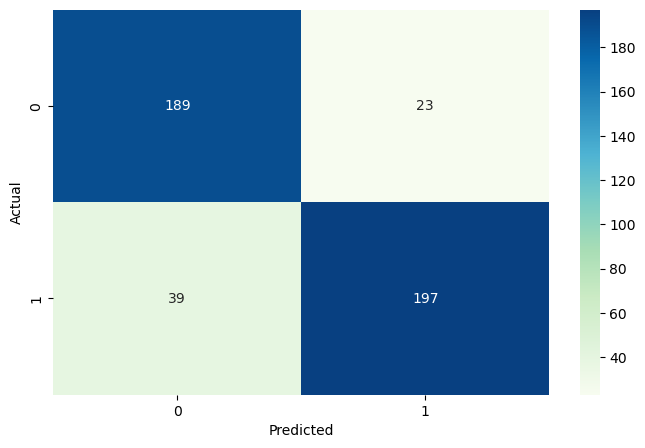

accuracy: 86.2%


In [206]:
features = classification_df.drop('NumPurchases', axis=1)               
x_train, x_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

mean_value = classification_df['NumPurchases'].median()
target =(classification_df['NumPurchases'] > mean_value).astype(int)

logisticRegClass = LogisticRegression()
logisticRegClass.fit(x_train, y_train)
y_pred = logisticRegClass.predict(x_test)

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="GnBu")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()
print(f"accuracy: {logisticRegClass.score(x_test, y_test) * 100:.1f}%")




The accuracy of the ${Logistic Regression}$  model is calculated like this:

$$Accuracy = \frac{TP + TN}{TP + TN + FP + FN} = \frac{189 + 197}{189 + 197+ 23 + 39} = 85.9\%$$


# ${ Desicion Tree }$ 

accuracy: 86.16071428571429 %


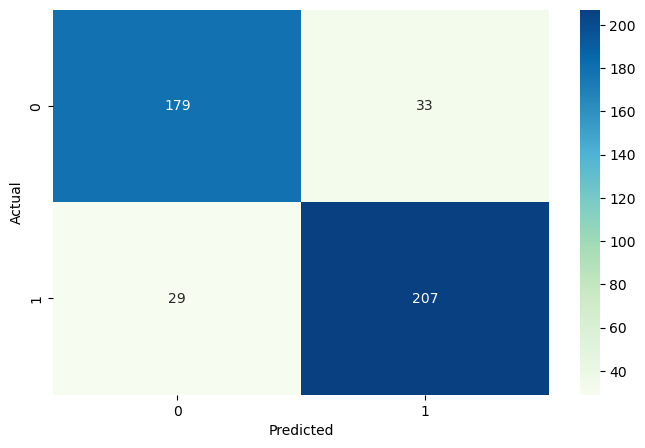

In [207]:
features = classification_df.drop('NumPurchases', axis=1)               
x_train, x_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

mean_value = classification_df['NumPurchases'].median()
target =(classification_df['NumPurchases'] > mean_value).astype(int)

treeClassifier = DecisionTreeClassifier(random_state=51)
treeClassifier.fit(x_train, y_train)
y_pred = treeClassifier.predict(x_test)

accuracy = accuracy_score(y_test, y_pred)
print("accuracy:", accuracy*100 , "%")

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="GnBu")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


The accuracy of the `Desicion Tree` model is calculated like this:

$$Accuracy = \frac{TP + TN}{TP + TN + FP + FN} = \frac{179 + 207}{179 + 207 + 33+ 29} = 86.1\%$$

## ${K - nearest - neighbours}$

Accuracy: 82.59


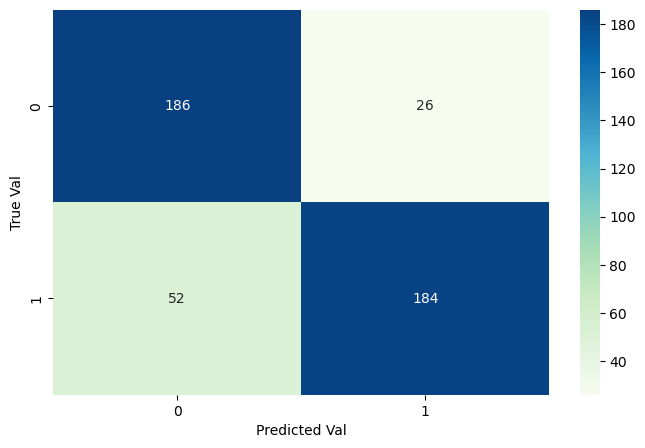

In [205]:
features = classification_df.drop('NumPurchases', axis=1)               
x_train, x_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
median_value = classification_df['NumPurchases'].median()
target = (classification_df['NumPurchases'] > median_value).astype(int)
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train, y_train)

predictions = knn.predict(x_test)
accuracy = accuracy_score(y_test, predictions)
print(f'Accuracy: {accuracy *100 :.2f}')

c = confusion_matrix(y_test, predictions)

plt.figure(figsize=(8, 5))
sns.heatmap(c, annot=True, fmt='d', cmap='GnBu')
plt.xlabel('Predicted Val')
plt.ylabel('True Val')
plt.show()





The accuracy of the `K - nearest - neighbours` model is calculated like this:

$$Accuracy = \frac{TP + TN}{TP + TN + FP + FN} = \frac{184 + 186 }{184 + 186 + 26+52} = 82.58\%$$

## Question 20: For models that have many parameters, obtain the optimal values for the parameters with the help of the GridSearchCV function.


## ${Logistic Regression}$


In [186]:

param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],  
    'solver': ['newton-cg', 'lbfgs', 'liblinear'], 
    'max_iter': [100, 200, 300 ,400] 
}

logreg = LogisticRegression()
grid_search = GridSearchCV(estimator=logreg, param_grid=param_grid, cv=5, verbose=1, scoring='accuracy')
grid_search.fit(x_train, y_train)
best_params = grid_search.best_params_
print('Best params for Logistic Regression:')
print( best_params)


Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best params for Logistic Regression:
{'C': 10, 'max_iter': 100, 'solver': 'newton-cg'}


# ${ KNN }$ 

In [187]:
param_grid = {
    'n_neighbors': range(1, 31),
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}

features = classification_df.drop('NumPurchases', axis=1)               
x_train, x_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
median_value = classification_df['NumPurchases'].median()
target = (classification_df['NumPurchases'] > median_value).astype(int)
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

knn = KNeighborsClassifier()
grid_search = GridSearchCV(knn, param_grid, cv=5, verbose=1, scoring='accuracy')
grid_search.fit(x_train, y_train)

print("Best parameters found:")
print(grid_search.best_params_)
print("Best score:")
print(grid_search.best_score_)

y_pred = grid_search.best_estimator_.predict(x_test)

print(classification_report(y_test, y_pred))

Fitting 5 folds for each of 180 candidates, totalling 900 fits
Best parameters found:
{'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'distance'}
Best score:
0.8906148363704268
              precision    recall  f1-score   support

           0       0.80      0.89      0.84       212
           1       0.89      0.81      0.84       236

    accuracy                           0.84       448
   macro avg       0.85      0.85      0.84       448
weighted avg       0.85      0.84      0.84       448



# ${ Desicion Tree }$ 

In [191]:
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': range(2, 16),
    'min_samples_split': range(2, 12),
    'min_samples_leaf': range(1, 5)
}

dt = DecisionTreeClassifier(random_state=42)
tree_grid_search = GridSearchCV(dt, param_grid, cv=5, verbose=1, scoring='accuracy')
tree_grid_search.fit(x_train, y_train)

print("Best params: ")
print(tree_grid_search.best_params_)
print("Best score: ")
print(grid_search.best_score_)

Fitting 5 folds for each of 1120 candidates, totalling 5600 fits
Best params: 
{'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best score: 
0.8906148363704268


# Question 21,22: overfitting vs. underfitting

##### Overfitting:
This occurs when a model learns the training data too well, including the noise and the outliers. . As a result, the model performs very well on the training data but poorly on new, unseen data (e.g., the test set or data it encounters in production).
having a high variance and a low bias. The key indicators of an overfitting model are:

Strategies to prevent overfitting include:

Simplifying the model by selecting one with fewer parameters.
Employing techniques like regularization.
Reducing the number of features in the data, often through some form of feature selection.
Collecting more data to train the model.
Implementing cross-validation to ensure that the model’s performance is robust across different subsets of the training data.
 Using techniques such as pruning for decision trees or early stopping for neural networks.
##### Underfitting:
Underfitting occurs when a model is too simple to capture the underlying structure in the data. This happens when the model has a high bias and low variance. The model performs poorly on the training data, and as a result, also performs poorly on unseen data. Underfitting is often the result of an overly simple model.



# Question 23: 

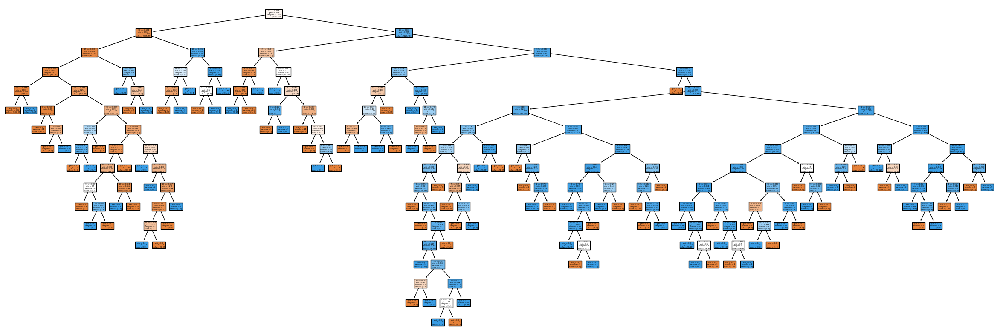

In [192]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
x_train_pd = pd.DataFrame(x_train)
y_train_pd = pd.DataFrame(y_train)
plt.figure(figsize=(30, 10))
plot_tree(treeClassifier,filled=True,feature_names=x_train_pd.columns.tolist())
plt.show()

# Collective learning methods
### Question 24: Study about at least two of the meta-parameters of this model and measure the effect of changing this meta-parameter on your results by drawing a graph and mentioning the results in detail.
Here are the key hyperparameters for a Random Forest:

- n_estimators: The number of trees in the forest. Increasing this number can improve the model’s performance but also increase computational time.

- max_depth: The maximum depth of the trees. Deeper trees can model more complex patterns but may lead to overfitting.

- min_samples_split: The minimum number of samples required to split an internal node. Higher values can lead to simpler trees, while lower values allow the trees to capture more information about the data.

- min_samples_leaf: The minimum number of samples required to be at a leaf node. Similar to min_samples_split, it can help in controlling overfitting.

- max_features: The number of features to consider when looking for the best split. This can be a fraction of the total features or an absolute number.

- max_leaf_nodes: Limits the number of leaf nodes in the tree, which can also control overfitting.

- random_state: Controls the randomness of the bootstrapping of the data and the selection of features to perform splits, ensuring reproducible results.

- criterion: The function to measure the quality of a split. “gini” is for the Gini impurity and “entropy” for information gain

In [190]:
raw_df

,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoffee,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumWebVisitsMonth,Complain,NumPurchases,UsedCampaignOffer
0,0.000000,0.493611,0.621359,0.50,0.571429,0.083844,0.714286,0.0,0.120846,0.585859,0.425318,0.442211,0.316522,0.664093,0.334601,0.243094,0.35,0.0,0.568182,1.0
1,0.000447,0.194263,0.592233,0.50,0.571429,0.066088,0.857143,0.5,0.237160,0.383838,0.118553,0.005025,0.003478,0.007722,0.003802,0.016575,0.25,0.0,0.136364,0.0
2,0.000893,0.370029,0.699029,0.50,0.714286,0.104131,0.714286,0.0,0.670695,0.262626,0.118553,0.246231,0.073623,0.428571,0.079848,0.116022,0.35,0.0,0.477273,0.0
3,0.001340,0.552408,0.883495,0.50,0.714286,0.036432,0.857143,0.0,0.300604,0.262626,0.007368,0.020101,0.011594,0.038610,0.011407,0.013812,0.30,0.0,0.181818,0.0
4,0.001787,0.475739,0.854369,1.00,0.428571,0.084078,0.857143,0.0,0.589124,0.949495,0.115874,0.216080,0.068406,0.177606,0.102662,0.041436,0.25,0.0,0.431818,0.0
5,0.002233,0.665356,0.718447,0.75,0.714286,0.075051,0.714286,0.5,0.285498,0.161616,0.348292,0.211055,0.056812,0.000000,0.159696,0.038674,0.35,0.0,0.500000,0.0
6,0.002680,0.086230,0.757282,0.50,0.285714,0.080076,0.714286,0.5,0.422961,0.343434,0.157401,0.326633,0.095072,0.193050,0.186312,0.074586,0.30,0.0,0.477273,0.0
7,0.003126,0.551961,0.893204,1.00,0.428571,0.046682,0.857143,0.0,0.241692,0.323232,0.050904,0.050251,0.032464,0.011583,0.003802,0.063536,0.40,0.0,0.227273,0.0
8,0.003573,0.433831,0.786408,1.00,0.714286,0.042010,0.857143,0.0,0.179758,0.191919,0.009377,0.000000,0.013913,0.011583,0.011407,0.005525,0.45,0.0,0.136364,1.0
9,0.004020,0.527120,0.553398,1.00,0.714286,0.004819,0.857143,0.5,0.403323,0.686869,0.018754,0.000000,0.003478,0.003861,0.003802,0.035912,1.00,0.0,0.045455,1.0


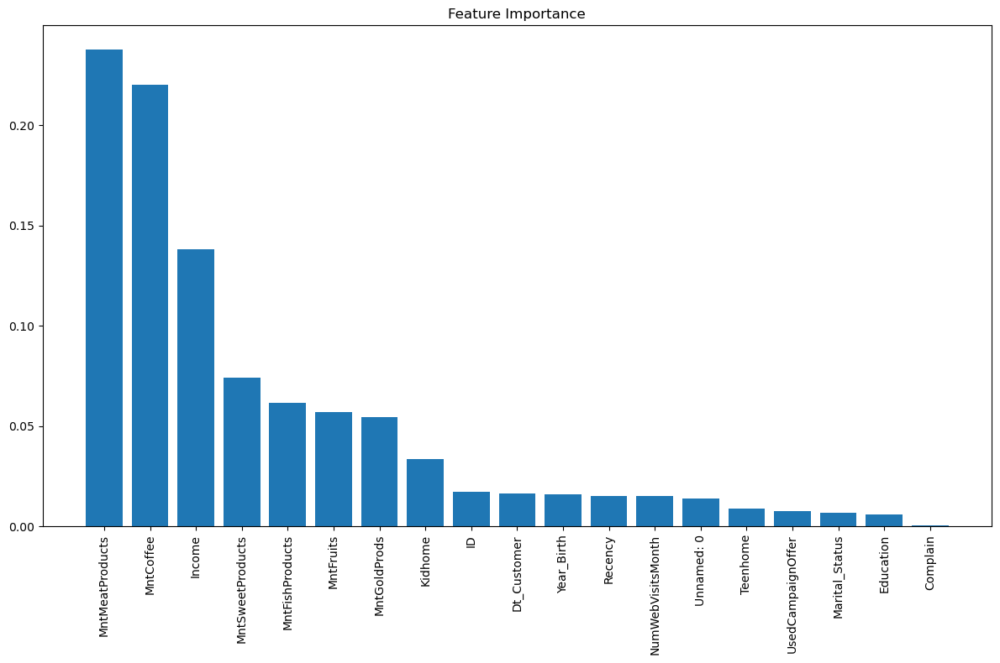

In [194]:
from sklearn.ensemble import RandomForestClassifier
temp_df = raw_df
F = temp_df.drop('NumPurchases', axis=1)
T =(classification_df['NumPurchases'] > mean_value).astype(int)
mean_value = classification_df['NumPurchases'].median()
F_train, F_test, T_train, T_test = train_test_split(F, T, test_size=0.2, random_state=42)
rf = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
rf.fit(F_train, T_train)


preds= rf.predict(F_test)
imprtncs = rf.feature_importances_
sorted_indices = imprtncs.argsort()[::-1]

plt.figure(figsize=(12, 8))
plt.title('Feature Importance')
plt.bar(range(F_train.shape[1]), imprtncs[sorted_indices], align='center')
plt.xticks(range(F_train.shape[1]), F_train.columns[sorted_indices], rotation=90)
plt.tight_layout()
plt.show()

train_result=[]
test_results=[]
train_result.append(rf.score(F_train, T_train))
test_results.append(rf.score(F_test, T_test))


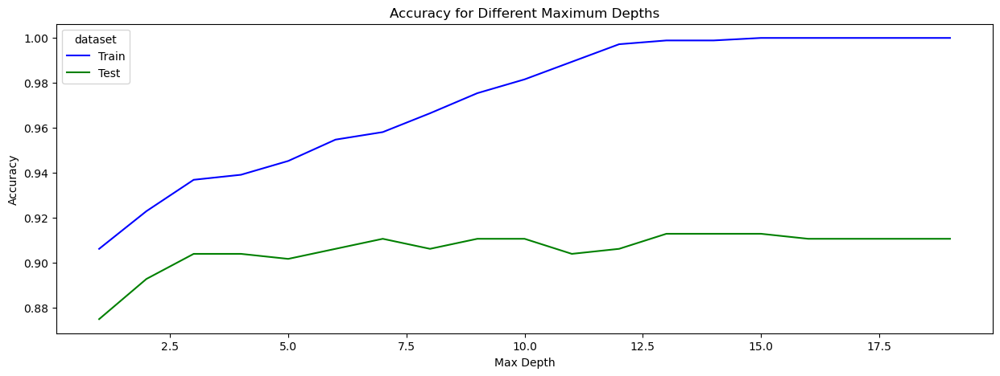

In [202]:
depth_range = range(1, 20)
depths_results = {'Maximum Depth': [], 'accuracy': [], 'dataset': []}

for d in depth_range:
    rf = RandomForestClassifier(max_depth=d, random_state=0)
    rf.fit(F_train, T_train)
    depths_results['Maximum Depth'].extend([d] * 2)
    depths_results['accuracy'].extend([rf.score(F_train, T_train), rf.score(F_test, T_test)])
    depths_results['dataset'].extend(['Train', 'Test'])

results_df = pd.DataFrame(depths_results)
plt.figure(figsize=(15, 5))
sns.lineplot(data=results_df, x='Maximum Depth', y='accuracy', hue='dataset', palette=['blue', 'green'])
plt.title('Accuracy for Different Maximum Depths')
plt.xlabel('Max Depth')
plt.ylabel('Accuracy')
plt.show()


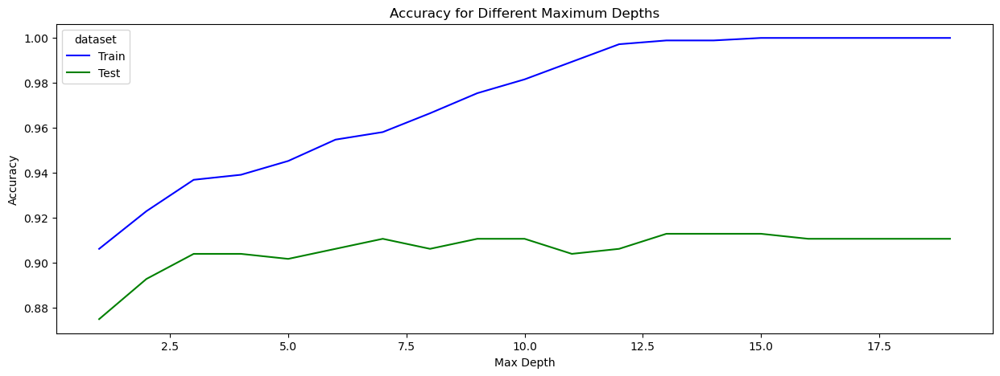

In [203]:
estimator_range = range(1, 20)
estimator_results = {'Maximum estimator': [], 'accuracy': [], 'dataset': []}

for d in depth_range:
    rf = RandomForestClassifier(max_depth=13,n_estimators=d random_state=0)
    rf.fit(F_train, T_train)
    depths_results['Maximum Depth'].extend([d] * 2)
    depths_results['accuracy'].extend([rf.score(F_train, T_train), rf.score(F_test, T_test)])
    depths_results['dataset'].extend(['Train', 'Test'])

results_df = pd.DataFrame(depths_results)
plt.figure(figsize=(15, 5))
sns.lineplot(data=results_df, x='Maximum Depth', y='accuracy', hue='dataset', palette=['blue', 'green'])
plt.title('Accuracy for Different Maximum Depths')
plt.xlabel('Max Depth')
plt.ylabel('Accuracy')
plt.show()

# Question 25: Compare the results of this model with the Decision Tree model. Read about bias and variance and the relationship between them.

- Bias refers to the error introduced by approximating a complex problem by a simpler model. It’s indicative of how well the model can capture the true relationships between the predictors and the target variable. High bias often leads to a model not fitting the training data well because it’s too simple (underfitting). On the other hand, low bias indicates that the model has enough flexibility to fit the data well.

- Variance reflects the model’s sensitivity to the specific sets of training data. A model with high variance effectively captures random noise in the training data, resulting in overfitting—the model performs well on the training data but poorly on new, unseen data. A model with low variance generalizes better to unseen data.

- High-bias models tend to be overly simple with very few parameters. They tend to have low variance as these models don’t change much with different training data. However, the trade-off is that they often don’t perform well on training data because they can’t capture complex patterns

`Coming to the comparison between the two in your modeling:`

- The Decision Tree model will likely fit the training set very well, possibly leading to higher accuracy on the training data but potentially overfitting, which could be evidenced by a significant drop in accuracy when evaluated on the test set.
- The Random Forest model is more robust to overfitting and often provides better performance on unseen data thanks to its ensemble strategy, even if it may not perform quite as well on the training data as the Decision Tree.

# Methods based on Privacy Differential

# Question 26: Adding noise to the data in different rows of a data set, what effect does it have on maintaining the security and privacy of people?

The main effects and considerations of this approach are as follows:

- Privacy Enhancement: By introducing noise, you reduce the likelihood that an individual’s data can be distinguished or re-identified in the dataset. Even if an attacker has access to the dataset with added noise, they cannot be certain about the true value for any particular individual, thus preserving privacy.

- Utility Trade-off: While adding noise improves privacy, it also reduces the accuracy and utility of the data. The challenge is to balance the amount of noise to ensure that the data remains useful for analysis while still protecting individual privacy. This is the core of the privacy-utility trade-off.

- Anonymization: Noise can help anonymize the data, making it harder to link records to real-world identities, even if some demographic or other potentially identifying information is included in the dataset.

- Compliance with Regulations: Adding noise to individual records can help organizations comply with data protection regulations like GDPR or HIPAA, which require that reasonable measures be taken to protect personal data.

- Aggregated Data Queries: The technique is often designed to maintain accuracy in the aggregate. Statistical queries (like counts, sums, averages) over the data will still produce approximately accurate results, where the noise averages out across the dataset.

- Data Quality: The type and amount of noise added must be carefully considered so that the data is not rendered useless. For example, adding a huge amount of noise to a person’s age might make any demographic analysis impossible.

- Algorithmic Choices: The decision about how much and what kind of noise to add will depend on the differential privacy algorithm used. Some algorithms, like Laplace or Gaussian mechanisms, have been developed specifically for this purpose and come with a set of guarantees about the level of privacy they confer (usually parameterized by ε - epsilon).


# Question 27: What is the difference between pulse noise and exponential noise methods?

thay can be added to data or signals. They differ in their distribution and characteristics:

`Pulse Noise (Also known as Salt-and-Pepper Noise):`

- Pulse noise is a form of noise that is usually caused by sharp, sudden disturbances in the image signal. It presents itself as sparsely occurring white and black pixels.
- This type of noise can be caused by errors in data transmission, faulty memory locations in hardware, or other unpredictable anomalies.
- In images, the result of this noise is random pixels being set to the maximum or minimum value, giving the appearance of “salt and pepper” spread across the image.
- It is typically non-Gaussian and does not follow a normal distribution.
Removing pulse noise often involves median filtering or other non-linear filters, as these are effective at removing such noise without blurring the image like a linear filter would.

`Exponential Noise:`

- Exponential noise follows an exponential distribution. It is often used in simulations to model the time between events in a Poisson process.
- This form of noise can be used to model the arrival times of photons in photodetectors, radioactive decay, or other processes where events occur continuously and independently at a constant average rate.
- It is a type of additive noise, where the magnitude of the noise is not dependent on the signal value, unlike multiplicative noise.
- The probability density function (pdf) of exponential noise decreases exponentially, hence the name.
- It is characterized by its rate parameter (λ), which describes the decay rate of the distribution.
- In terms of use for maintaining security and privacy within data sets, these two types of noise serve different purposes and are applied in different contexts. For example, pulse noise is not typically associated with differential privacy directly because it introduces outliers which can be very distinguishable. In contrast, exponential noise can be used in the context of differential privacy where the noise is calibrated with respect to a sensitivity measure and a privacy budget ε (epsilon) to ensure that the contributions of individual data points are obscured in the aggregate results.

# Question 28: Perform the steps related to the classification phase using the library on the new dataset with noise and compare the results with the previous part.
`Using Noise (Pulse or Exponential) in a Dataset:`

Introducing noise such as pulse noise or exponential noise to a dataset is typically not a data processing step one takes intentionally unless simulating specific conditions or employing differential privacy methods.
Noise in data generally represents unwanted errors that decrease the quality of data and adversely affect the predictions if it’s fed into a predictive model like a Random Forest.


`Random Forest on a DataFrame (df):`

When using Random Forest on a DataFrame, the goal is to find patterns that predict an output variable based on input features.
It is a powerful non-linear method that can handle complex interactions between features.


- it is theoretically possible to protect user privacy while still drawing useful inferences from the data—though with reduced accuracy due to the effect of the noise. The Random Forest algorithm, due to its ensemble nature, might still be able to find robust patterns despite the introduced noise, especially if the noise is not overwhelming.

In [66]:
#scale = 1.0  
numeric_cols= F_test.select_dtypes(include=np.number).columns

for col in numeric_cols:
    noise = np.random.exponential(1.0, F_test[col].shape)
    F_test[col] += noise
    
F_test

,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoffee,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumWebVisitsMonth,Complain,UsedCampaignOffer
324,3.984715,0.593114,2.592435,2.456744,2.873251,2.060234,2.279387,3.267809,2.674504,3.873515,3.110703,1.075944,3.715262,1.288464,3.015342,4.309809,2.688920,1.692136,2.328923
96,0.512945,4.636750,3.576723,0.992019,2.133032,1.068660,5.849708,3.168017,1.711547,3.745495,4.971003,1.380988,1.885762,0.561075,1.430620,3.152148,0.926249,3.599307,1.934425
2104,1.309229,3.652532,6.317632,1.299386,2.674844,2.632663,2.165628,0.520387,3.427536,0.978149,2.658070,1.350650,0.496854,6.300196,2.648284,0.315793,3.468126,6.542284,1.986545
1259,2.118136,0.739207,1.769678,2.461388,1.854770,4.797729,1.856250,1.759230,2.743887,4.484817,2.178376,0.951590,0.965451,1.839405,1.268575,2.982889,1.967146,1.153448,1.769798
1061,2.835372,3.117847,1.923895,3.976895,1.512390,4.130619,2.023762,2.612293,5.396859,2.240751,2.239801,4.432177,1.509888,1.033621,1.597235,2.019272,1.178520,1.372512,2.907896
1805,2.329577,2.089018,3.366518,2.781268,3.294104,0.623477,2.345292,2.073340,2.534643,1.194361,0.863582,3.143426,1.283595,1.152236,1.801241,2.634248,4.635144,0.488744,2.216766
916,2.767052,3.744380,2.407439,1.703104,3.579838,0.354060,2.971215,1.246167,3.283589,3.313117,2.115648,2.064848,1.517661,0.413072,1.661554,2.188016,2.892347,1.097867,1.000792
350,3.450865,3.292866,3.640486,0.831378,1.737150,2.150540,2.976866,1.793919,0.916106,2.239788,4.815245,2.428697,3.077631,4.647855,0.869065,2.247754,3.464799,0.891433,3.644578
1901,3.084985,1.713997,2.808870,3.257389,2.510011,0.461057,2.463635,0.258603,9.051349,0.554487,3.355654,1.767518,3.230953,2.007369,1.791245,2.550315,2.821691,1.632361,3.479169
1650,5.296136,4.228688,1.379087,2.342659,3.638274,0.892021,1.382674,0.919428,2.103205,3.837612,3.477205,1.099053,3.168670,0.955637,1.275674,2.443436,2.209230,1.398816,0.874756


# * ${Bonus}$ : 
# methods based on gragient- boosting

# Question 29: explain about gradient-boosting method. compare boosting tree with desicion tree.
`How Gradient Boosting Works:`

- Start by making an initial prediction (this could be the mean of the labels for all instances in regression tasks). This prediction is usually very simplistic.

- Calculate the residuals, which are the differences between this initial prediction and the true values.

- Build a decision tree to predict these residuals, not the actual target values. Essentially, the tree is trying to correct the mistakes of the current model.

- The predictions from this tree are then scaled by a factor known as the learning rate before being added to the model’s overall predictions. The learning rate is a hyperparameter that controls how strongly each tree tries to correct the mistakes of its predecessors. It helps to prevent overfitting by constraining the influence of each individual tree.

- Evaluate the new residuals (i.e., the difference between the updated predictions and the true values).

- Build a new tree to predict the updated residuals.

- Continue this process for a fixed number of iterations, or until the residuals are minimized, or the improvement falls below a threshold.

#### Differences:Comparison in Use Cases:

When to Use Decision Tree

- When a fast and straightforward model is needed.
- When model interpretability is essential.
- When the dataset is small and the risk of overfitting is manageable.

When to Use Boosting Trees:

- When model performance is prioritized over simplicity.
- When dealing with complex problems where interactions and non-linear relationships are expected.
- When controlling overfitting with a careful choice of hyperparameters and accepting a longer training time for better performance.

In conclusion, while decision trees are fundamental components of boosting trees, their functions and capabilities are quite distinct. Decision trees are simple and interpretable but can overfit easily, while boosting trees are more powerful, robust against overfitting, but complex and less interpretable. The choice between the two often hinges on the particular needs and constraints of your machine learning problem.



# Question 30: how doese XGBoost work?

Here’s how XGBoost works:

Ensemble Method:
XGBoost is an ensemble learning method, specifically an implementation of gradient boosting machines (GBM). Instead of training one model, XGBoost trains multiple models sequentially, with each new model attempting to correct the errors made by the previous models in the sequence.

Gradient Boosting Framework:
The core idea of XGBoost involves boosting weak learners (decision trees) by focusing on correcting the mistakes of the previous trees. At each iteration, a new tree is added that predicts the residuals or errors of the whole ensemble thus far. The learning task is to minimize a given loss function with a new model added at each iteration.

Regularization:
XGBoost improves upon the standard GBM framework by introducing regularization parameters (L1 and L2), which control overfitting and improve predictive power. This formal regularization of the objective function makes XGBoost distinctive and powerful.

Objective Function:
XGBoost seeks to minimize a regularized objective function that combines a convex loss function (to measure how well the model fits the data) and a regularization term (to penalize complex models). The loss function depends on the type of problem being solved (e.g., regression, classification).

Tree Construction:
XGBoost uses a more efficient algorithm for constructing decision trees, which it calls a “Gradient Boosted Tree”. This involves both the traditional decision tree algorithm and specific optimizations such as pre-sorting and storing the data in a compressed column block structure, which makes the algorithm faster and more scalable.

System Optimization:
XGBoost implements several system-level optimizations, including:

Parallelization: XGBoost parallelizes the construction of trees across all your CPU cores during the training phase.
Distributed Computing: It supports distributed computing and can handle large-scale data that doesn’t fit into the single machine memory.
Cache Awareness: XGBoost is designed to make efficient use of hardware resources, with cache-aware access patterns for data structures.
Out-of-Core Computing: It can handle situations where the size of data exceeds the capacity of system memory.
Algorithmic Enhancements:

Sparsity Awareness: XGBoost can handle sparse data and missing values natively.
Weighted Quantile Sketch: For efficiently finding the best split points in weighted data.
Column Block: Uses a compressed format to store the data, which improves cache access patterns and reduces memory consumption.
Flexible:
XGBoost works with a variety of data types, loss functions, and can be integrated with various interfaces, including Python, R, and Scala.

# Question 31: Hyperparameters of the XGBClassifier
The XGBClassifier is a popular implementation of gradient boosting from the XGBoost library that’s typically used for classification tasks. It comes with a variety of hyperparameters that control the learning process. Here are some of the key hyperparameters you might tune when using XGBClassifier:

- n_estimators: Number of gradient boosted trees. Equivalent to the number of boosting rounds.

- max_depth: Maximum depth of the individual trees. Deeper trees can model more complex patterns but can also lead to overfitting.

- learning_rate: Also known as eta, it reduces the step size for each boosting round, to prevent overfitting. Lower values mean more robust to overfitting but require more boosting rounds (higher n_estimators).

- subsample: Fraction of the training instances (rows) to be used for training each tree. Lower values prevent overfitting but too low might lead to underfitting. Generally, values between 0.5 to 0.9 are used.

- colsample_bytree: Fraction of the features (columns) to be used for constructing each tree. It’s like the max_features parameter in RandomForest.



In [59]:
import xgboost as xgb
model = xgb.XGBClassifier(objective='binary:logistic', n_estimators=100, seed=42)
model.fit(F_train, T_train)
y_pred = model.predict(F_test)
accuracy = accuracy_score(T_test, y_pred)
print("Accuracy:")
printf(accuracy *100 )

Model Accuracy: 89.95535714285714%


In [69]:
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1, 0.2, 0.06],
    'max_depth': [3, 4, 5,6,7,8,9],
}

xgb = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')
grid = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=5, scoring='accuracy')
grid.fit(F_train, T_train)
print("better params:")
print(grid.best_params_)

y_pred = grid.best_estimator_.predict(F_test)

accuracy = accuracy_score(T_test, y_pred)
print("accuracy:")
print(accuracy * 100)

better params:
{'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 200}
accuracy:
52.67857142857143
